## plot optical flow and vector fields

In [105]:

def plot_optical_flow(path_in, path_out, time, time_displacement):
    
    """
    calculating optical flows of pixels between two input images 
    using the skimage.registration.optical_flow_ilk function
    
    plotting and saving images
    """
    import numpy as np
    from matplotlib import pyplot as plt
    from skimage.color import rgb2gray
    from skimage.transform import warp
    from skimage.registration import optical_flow_tvl1, optical_flow_ilk
    from tifffile import imread, imwrite
    import matplotlib.pyplot as plt
    import scipy.ndimage as nd
    from napari import Viewer
    from pathlib import Path
    import skimage
    import matplotlib.pyplot as plt

    path_in = Path(path_in)
    image = imread(path_in)
    
    im_t1 = image[time,:,:]
    im_t2 = image[time+time_displacement,:,:]
    
    # --- Compute the optical flow
    v, u = optical_flow_ilk(im_t1, im_t2, radius=15)

    # --- Compute flow magnitude
    norm = np.sqrt(u ** 2 + v ** 2)

    # --- Display
    fig = plt.figure(figsize=(8, 4))
    '''
    # --- Sequence image sample

    ax0.imshow(im_t1, cmap='gray')
    ax0.set_title("Sequence image sample")
    ax0.set_axis_off()
    '''
    # --- Quiver plot arguments

    nvec = 20  # Number of vectors to be displayed along each image dimension
    nl, nc = im_t1.shape
    step = max(nl//nvec, nc//nvec)

    y, x = np.mgrid[:nl:step, :nc:step]
    u_ = u[::step, ::step]
    v_ = v[::step, ::step]

    plt.imshow(norm)
    plt.quiver(x, y, u_, v_, color='r', units='dots',
               angles='xy', scale_units='xy', lw=3)
    plt.title("Cell flow from time " +str(time)+" to time "+str(time+time_displacement))
    plt.axis('off')
    plt.colorbar(label = "cell displacement")
    fig.tight_layout()
    plt.savefig(path_out+"optical_flow_t"+str(time)+"to_t"+str(time+time_displacement), )



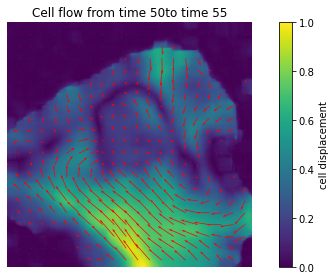

In [31]:
plot_optical_flow('../../data/placozoan-movie.tif', '../../data/', 50, 5)

In [120]:
def safe_images_for_optical_flow_gif(path_in_raw_image, path_out, time, end_time, time_displacement):
    """
    plotting and saving a time series of optical flow images, 
    with defined starting and stopping time, as well as step size
    """
    for time_point in range(time, end_time, time_displacement):
        plot_optical_flow(path_in_raw_image, path_out, time_point, time_displacement)


/Users/gloof/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


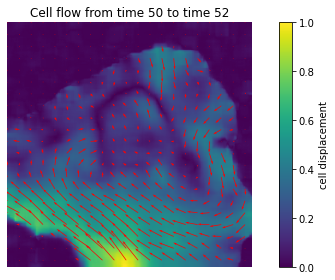

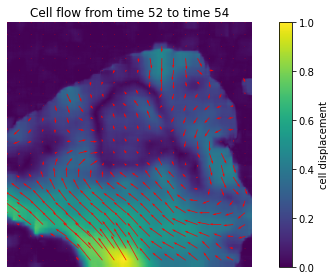

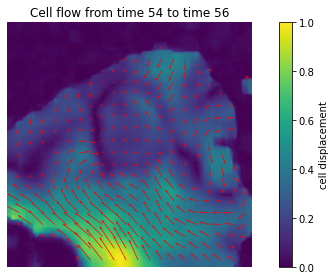

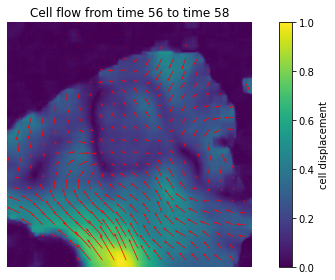

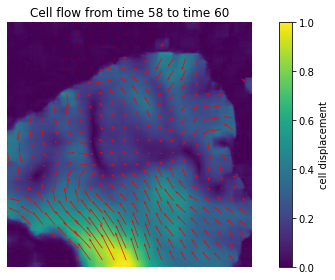

...

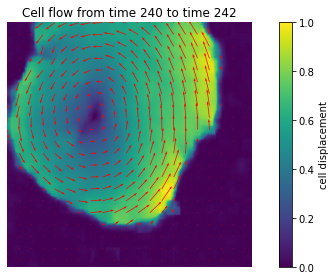

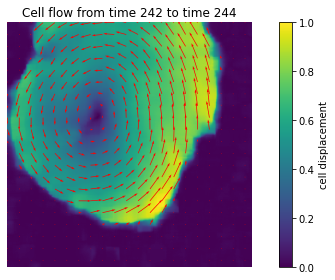

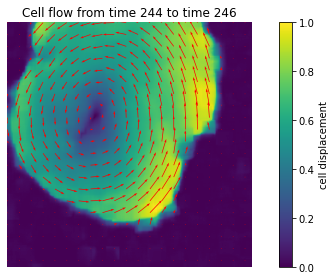

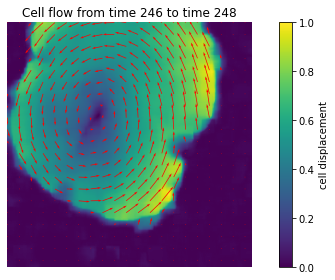

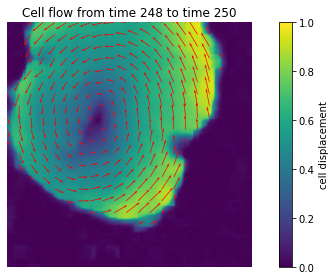

In [122]:
build_optical_flow_gif('../../data/placozoan-movie.tif', '../../data/optical_flow/', 50, 250, 2)